# NLP DL Lang Identification V6


## Importing Dependencies

In [4]:
import numpy as np # linear algerbra
import pandas as pd # data processing
import matplotlib.pyplot as plt # plotting
import seaborn as sns # plotting
import json # data processing(.json)

from sklearn.preprocessing import LabelEncoder # Creates placeholders for categorical variables
from sklearn.feature_extraction.text import CountVectorizer # converts text into vector matrix
from sklearn.model_selection import train_test_split # split data into training and testing sets
from sklearn.naive_bayes import MultinomialNB # ML model for naive bayes
from sklearn.metrics import accuracy_score, confusion_matrix # measure the accuracy of the model
from sklearn.metrics import classification_report # classification report of the model
 
import re # NLP
import nltk # natural langauge processing
from nltk.tokenize import word_tokenize # tokenizer
from nltk.stem import PorterStemmer # stemmer
from nltk.corpus import stopwords # stopwords

from wordcloud import WordCloud # create word cloud images of text

import tensorflow as tf # create neural networks
from tensorflow.keras import Sequential # create squential NN model
from tensorflow.keras.layers import Dense # implements the operation: output = activation(dot(input, kernel) + bias)
from tensorflow.keras.utils import plot_model # plot model architecture
from tensorflow.keras.callbacks import EarlyStopping # early stopping of training
from tensorflow.keras.models import load_model # load saved model

from sklearn.model_selection import GridSearchCV # hyperparameter optimization
from sklearn.model_selection import RandomizedSearchCV # hyperparameter optimization
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier # linking keras model to sklearn

%matplotlib inline 
# With this backend, the output of plotting commands is displayed inline within frontends
# like the Jupyter notebook, directly below the code cell that produced it. The resulting 
# plots will then also be stored in the notebook document

We configure CPU/GPU for computation in tensorflow.

In [9]:
# ensure CPU is enabled for tensorflow
# skip this step if you have never configured GPU for tensorflow

import os

os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # 0 for GPU
                                         # -1 for CPU
if tf.test.gpu_device_name():
    print('GPU found')
else:
    print("No GPU found")

No GPU found


## Loading the data

We first ensure that the text in other scripts is loadable by using the following code for utf-8 encoding.

In [10]:
# - *- coding: utf- 8 - *-

WiLI-2018, the Wikipedia language identification benchmark dataset, contains 235000 paragraphs of 235 languages.
Each language in this dataset contains 1000 rows/paragraphs.

We use a dataset that contains 22 selective languages from the original dataset which includes the following Languages

- English
- Arabic
- French
- Hindi
- Urdu
- Portuguese
- Persian
- Pushto
- Spanish
- Korean
- Tamil
- Turkish
- Estonian
- Russian
- Romanian
- Chinese
- Swedish
- Latin
- Indonesian
- Dutch
- Japanese
- Thai

Dataset: https://www.kaggle.com/zarajamshaid/language-identification-datasst

In [5]:
# read dataset which in .csv format

data = pd.read_csv('dataset.csv', encoding='utf-8').copy() # creates a dataframe of a copy of the dataset
                                                           # utf-8 encoding use to be able to read text in other langauge
print(data.shape)  # shape of the dataset
data.head()        # first 5 rows of the dataset

(22000, 2)


,Text,language
0,klement gottwaldi surnukeha palsameeriti ning ...,Estonian
1,sebes joseph pereira thomas på eng the jesuit...,Swedish
2,ถนนเจริญกรุง อักษรโรมัน thanon charoen krung เ...,Thai
3,விசாகப்பட்டினம் தமிழ்ச்சங்கத்தை இந்துப் பத்திர...,Tamil
4,de spons behoort tot het geslacht haliclona en...,Dutch


In [6]:
data.tail() # last 5 rows of the dataset

,Text,language
21995,hors du terrain les années et sont des année...,French
21996,ใน พศ หลักจากที่เสด็จประพาสแหลมมลายู ชวา อินเ...,Thai
21997,con motivo de la celebración del septuagésimoq...,Spanish
21998,年月，當時還只有歲的她在美國出道，以mai-k名義推出首張英文《baby i like》，由...,Chinese
21999,aprilie sonda spațială messenger a nasa și-a ...,Romanian


In [7]:
# categories in our target variable

data['language'].unique() 

array(['Estonian', 'Swedish', 'Thai', 'Tamil', 'Dutch', 'Japanese',
       'Turkish', 'Latin', 'Urdu', 'Indonesian', 'Portugese', 'French',
       'Chinese', 'Korean', 'Hindi', 'Spanish', 'Pushto', 'Persian',
       'Romanian', 'Russian', 'English', 'Arabic'], dtype=object)

We see the 22 different categories that we will be classifiying the dataset into.

## Preprocessing the data

In [8]:
# checking for null values

data.isnull().sum()

Text        0
language    0
dtype: int64

In [9]:
# checking the datatype of the features

data.dtypes

Text        object
language    object
dtype: object

In [10]:
# number of of samples per language (category)

data['language'].value_counts()

Korean        1000
Persian       1000
Russian       1000
English       1000
Portugese     1000
Spanish       1000
French        1000
Romanian      1000
Indonesian    1000
Thai          1000
Swedish       1000
Urdu          1000
Hindi         1000
Dutch         1000
Japanese      1000
Arabic        1000
Tamil         1000
Latin         1000
Pushto        1000
Estonian      1000
Turkish       1000
Chinese       1000
Name: language, dtype: int64

The dataset contains 1000 samples for each language, hence are dataset has a total of 22000 rows.

In [11]:
# dropping duplicate samples

data = data.drop_duplicates(subset='Text')
data = data.reset_index(drop=True)

In [18]:
# rechecking the number of samples per language

data['language'].value_counts()

Turkish       1000
Japanese      1000
Chinese       1000
Romanian      1000
English       1000
Korean        1000
Thai          1000
Urdu          1000
Persian       1000
Estonian       999
Russian        999
Arabic         998
Portugese      997
Spanish        996
Dutch          996
Pushto         993
Swedish        992
French         990
Hindi          990
Tamil          981
Indonesian     975
Latin          953
Name: language, dtype: int64

We see that some of the languages had text that had been repeated and hence we dropped those samples.

In [19]:
# Download the data for all supported languages for NLTK using the following code:

# import nltk
# nltk.download()

In [20]:
# languages stopwords supported by NLTK

print(stopwords.fileids())

['arabic', 'azerbaijani', 'danish', 'dutch', 'english', 'finnish', 'french', 'german', 'greek', 'hungarian', 'indonesian', 'italian', 'kazakh', 'nepali', 'norwegian', 'portuguese', 'romanian', 'russian', 'slovene', 'spanish', 'swedish', 'tajik', 'turkish']


We see that not all languages in our dataset are supported by NLTK and hence we download stopwords for other languages through the following links:


- 'Arabic': NLTK
- 'Chinese': https://github.com/stopwords-iso/stopwords-zh
- 'Dutch':  NLTK
- 'English':  NLTK
- 'Estonian': https://github.com/kristel-/estonian-stopwords
- 'French':  NLTK
- 'Hindi': https://github.com/taranjeet/hindi-tokenizer/blob/master/stopwords.txt
- 'Indonesian':  NLTK
- 'Japanese': https://github.com/stopwords-iso/stopwords-ja
- 'Korean': https://gist.github.com/spikeekips/40eea22ef4a89f629abd87eed535ac6a
- 'Latin': https://github.com/aurelberra/stopwords/blob/master/stopwords_latin.txt
- 'Persian': https://github.com/rahmanidashti/PersianStopWords/blob/master/stopwords_all.txt
- 'Portugese': NLTK
- 'Pushto': https://github.com/mohbadar/pashto-stopwords
- 'Romanian': NLTK 
- 'Russian': NLTK
- 'Spanish':  NLTK
- 'Swedish': NLTK
- 'Tamil': https://github.com/AshokR/TamilNLP/blob/master/tamilnlp/Resources/TamilStopWords.txt
- 'Thai':  https://github.com/stopwords-iso/stopwords-th
- 'Turkish': NLTK
- 'Urdu' : https://github.com/Delta-Sigma/urdu-stopwords/blob/master/urdu_stopwords.txt

We create a list of stopwords for each language and create a list of alphanumeric characters and combine them to create one list of list containing all stopwords.

We obtain stopwords through 3 formats :
- Through NLTK
- In a .txt dataset
- In a .json dataset
We apply different methods for extracting stopwords from each of the 3 formats.

In [21]:
# creating lists of language wise stopwords
# for langauges supported by NLTK, stopwords can be easily be obtained through corpus
# for language not supported by NLTK, stopwords are obtained through .txt or .json datasets

arabic_stopwords = stopwords.words('arabic')

chinese_stopwords = pd.read_csv('stopwords-chinese.txt', sep='\n', index_col=False, squeeze=True).tolist()

dutch_stopwords = stopwords.words('dutch')

english_stopwords = stopwords.words('english')

estonian_stopwords = pd.read_csv('estonian-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

french_stopwords = stopwords.words('french')

hindi_stopwords = pd.read_csv('hindi-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

indonesian_stopwords = stopwords.words('indonesian')

japanese_stopwords = pd.read_csv('japanese-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

korean_stopwords = pd.read_csv('korean-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

latin_stopwords = pd.read_csv('latin-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

persian_stopwords = pd.read_csv('persian-stopwords.txt', sep='\n', index_col=False, squeeze=True,quoting=3 , error_bad_lines = False).tolist()

portuguese_stopwords = stopwords.words('portuguese')

file = open('pashto-stopwords.json', 'r')
pushto_stopwords_dict = json.load(file)
pushto_stopwords = []
for i in range(len(pushto_stopwords_dict['word'])):
    pushto_stopwords.append(pushto_stopwords_dict['word'][str(i)])
file.close()

romanian_stopwords = stopwords.words('romanian')

russian_stopwords = stopwords.words('russian')

spanish_stopwords = stopwords.words('spanish')

swedish_stopwords = stopwords.words('swedish')

tamil_stopwords = pd.read_csv('tamil-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

thai_stopwords = pd.read_csv('thai-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

turkish_stopwords = stopwords.words('turkish')

urdu_stopwords = pd.read_csv('urdu-stopwords.txt', sep='\n', index_col=False, squeeze=True).tolist()

In [22]:
# combining stopwords of all langauges 

stopwords = arabic_stopwords + chinese_stopwords + dutch_stopwords + english_stopwords + estonian_stopwords + french_stopwords + hindi_stopwords + indonesian_stopwords + japanese_stopwords + korean_stopwords+ latin_stopwords + persian_stopwords + portuguese_stopwords + pushto_stopwords + romanian_stopwords+ russian_stopwords + spanish_stopwords + swedish_stopwords + tamil_stopwords + thai_stopwords + turkish_stopwords + urdu_stopwords

In [23]:
# adding nonalphanumeric char to stopwords

nonalphanumeric = ['\'', '.', ',', '\"', ':', ';', '!', '@', '#', '$', '%', '^', '&',
                 '*', '(', ')', '-', '_', '+', '=', '[', ']', '{', '}', '\\', '?', 
                 '/','>', '<', '|', ' '] 

stopwords = stopwords + nonalphanumeric

In [24]:
# total stop words

len(stopwords)

16023

Our stopwords list contains a total of 16023 stopwords that will be reomoved form the dataset.

We create a function that takes text as input and preprocesses it to give clean text as output.

The function clean_text():
- tokenizes the text into a list of words
- lowers all words into lowercase
- removes stopwords from the list of lowered words
- stems the words
- returns them in form of a string seperated by " "

In [25]:
def clean_text(text):
    """
    takes text as input and returns cleaned text after tokenization, 
    stopwords removal and stemming
    """
    tokens = word_tokenize(text) # creates text into list of words
    words = [word.lower() for word in tokens if word not in stopwords] # creates a list with words which are not stopwords
    words = [PorterStemmer().stem(word) for word in words] # stems(remove suffixes and prefixes)  words
    return " ".join(words) # joins the list of cleaned words into a sentence string

In [26]:
# applying clean_text function to all rows in 'Text' column 

data['clean_text'] = data['Text'].apply(clean_text)

Computers cannot understand text data, they only understand numbers. Hence we provide placeholder numbers to each language category using the label encoder.

In [27]:
# using LabelEncoder to get placeholder number values for categorical variabel 'language'

le = LabelEncoder()
data['language_encoded'] = le.fit_transform(data['language'])
data.head()

,Text,language,clean_text,language_encoded
0,klement gottwaldi surnukeha palsameeriti ning ...,Estonian,klement gottwaldi surnukeha palsameer paigutat...,4
1,sebes joseph pereira thomas på eng the jesuit...,Swedish,sebe joseph pereira thoma eng jesuit sino-russ...,17
2,ถนนเจริญกรุง อักษรโรมัน thanon charoen krung เ...,Thai,ถนนเจริญกรุง อักษรโรมัน thanon charoen krung เ...,19
3,விசாகப்பட்டினம் தமிழ்ச்சங்கத்தை இந்துப் பத்திர...,Tamil,விசாகப்பட்டினம் தமிழ்ச்சங்கத்தை இந்துப் பத்திர...,18
4,de spons behoort tot het geslacht haliclona en...,Dutch,spon behoort geslacht haliclona behoort famili...,2


In [28]:
# list of languages encoded with thier respective indices representing their placeholder numbers

lang_list = [i for i in range(22)]
lang_list = le.inverse_transform(lang_list)
lang_list = lang_list.tolist()
lang_list

['Arabic',
 'Chinese',
 'Dutch',
 'English',
 'Estonian',
 'French',
 'Hindi',
 'Indonesian',
 'Japanese',
 'Korean',
 'Latin',
 'Persian',
 'Portugese',
 'Pushto',
 'Romanian',
 'Russian',
 'Spanish',
 'Swedish',
 'Tamil',
 'Thai',
 'Turkish',
 'Urdu']

lang_list contains a list of all encoded languages with thier indices as thier placeholder values.

## Exploring the data

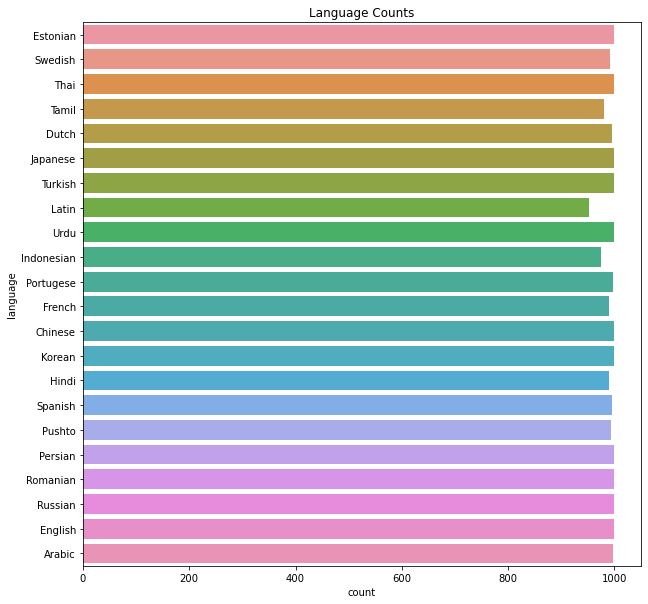

In [22]:
# plotting a language-wise freqeuncy distribtion for number of samples in each language 

plt.figure(figsize=(10,10))
plt.title('Language Counts')
ax = sns.countplot(y=data['language'], data=data)
plt.show()

The frequency plot of each language shows us the amount of samples we have for each language. All languages except Estonian, Russian, Arabic, Portugese, Dutch, Spanish, Pushto, Swedish, Hindi, French, Tamil, Indonesian and Latin have 1000 samples. 

We create a function that takes in language and font_path(path of folder with font in it for languages in different scripts) and creates a wordcloud of that language using text from our dataset.

For languages in scripts other than Latin script(english is in latin script) or Arabic script(urdu is in arabic script), download a font for the language in .ttc or .ttf format, paste it in C:\Windows\Fonts and mention the path in font_path.

In [23]:
def word_cloud(language, font_path='arial'):
    """
    takes in langauge and font_path(folder where font is saved) as input and returns wordcloud
    """
    data_language = data[data['language']==language]
    wordcloud = WordCloud(font_path=font_path, background_color="white").generate(' '.join(data_language['clean_text'].tolist()))
    fig = plt.figure(figsize=(16,8),)
    fig.suptitle(f'Word Cloud {language}', fontsize=40)
    plt.axis('off')
    plt.imshow(wordcloud)

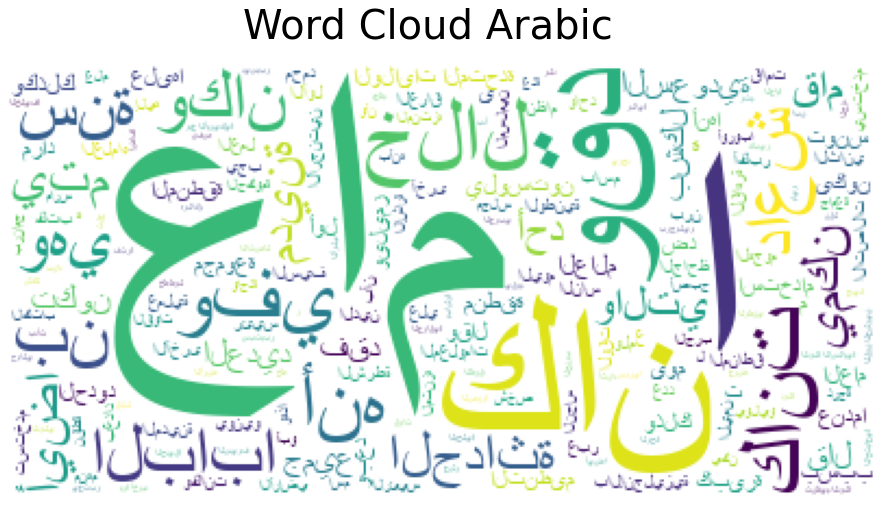

In [24]:
word_cloud('Arabic')

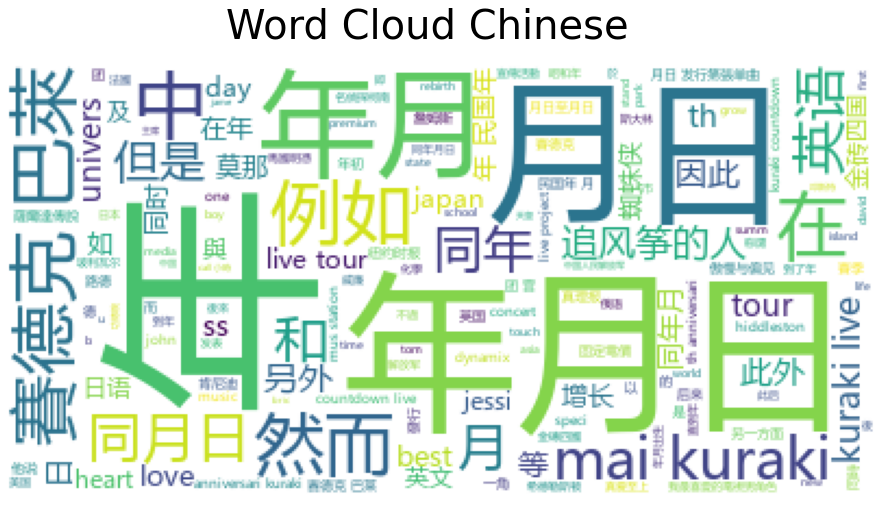

In [25]:
word_cloud('Chinese', font_path=r'C:\Windows\Fonts\msyh.ttc')

We see that there are english words present in the chinsese text and hence we will remove them.

We create a function that takes text as input and removes all words in latin script from it.

In [29]:
def remove_english(text):
    """
    function that takes text as input and returns text without english words
    """
    pat = "[a-zA-Z]+"
    text = re.sub(pat, "", text)
    return text

In [30]:
data_Chinese = data[data['language']=='Chinese'] # Chinese data in dataset

clean_text = data.loc[data.language=='Chinese']['clean_text']
clean_text = clean_text.apply(remove_english) # removing english words

data_Chinese.loc[:,'clean_text'] = clean_text

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [31]:
# removing old chinese text and appending new cleaned chinese text

data.drop(data[data['language']=='Chinese'].index, inplace=True, axis=0)
data = data.append(data_Chinese)

We re-shuffle the dataset to have train and test samples representative of the entire dataset.

In [32]:
# shuffling dataframe and resetting index

data =data.sample(frac=1).reset_index(drop=True)

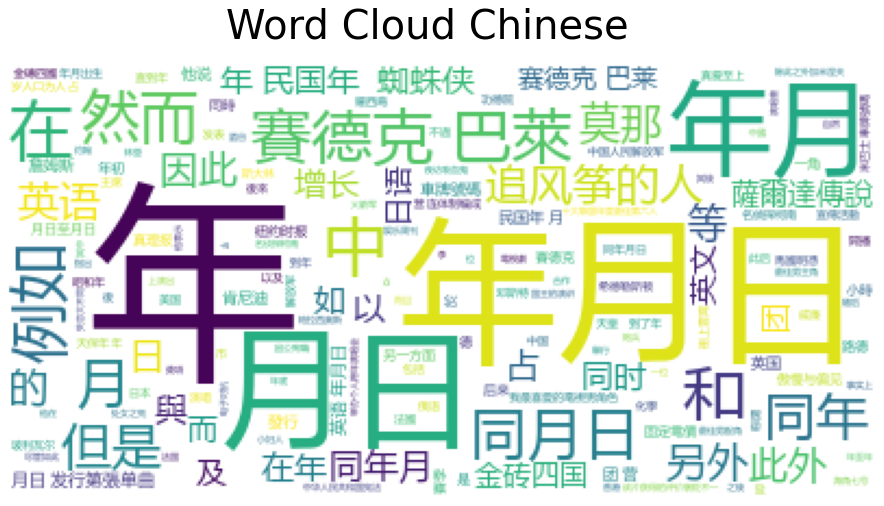

In [30]:
word_cloud('Chinese', font_path=r'C:\Windows\Fonts\msyh.ttc')

Hence we see that the Chinese text is now cleaned

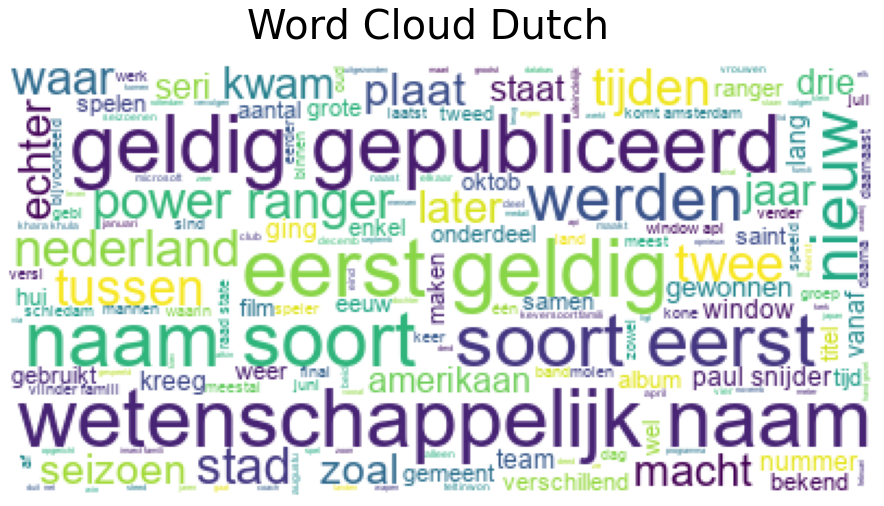

In [31]:
word_cloud('Dutch')

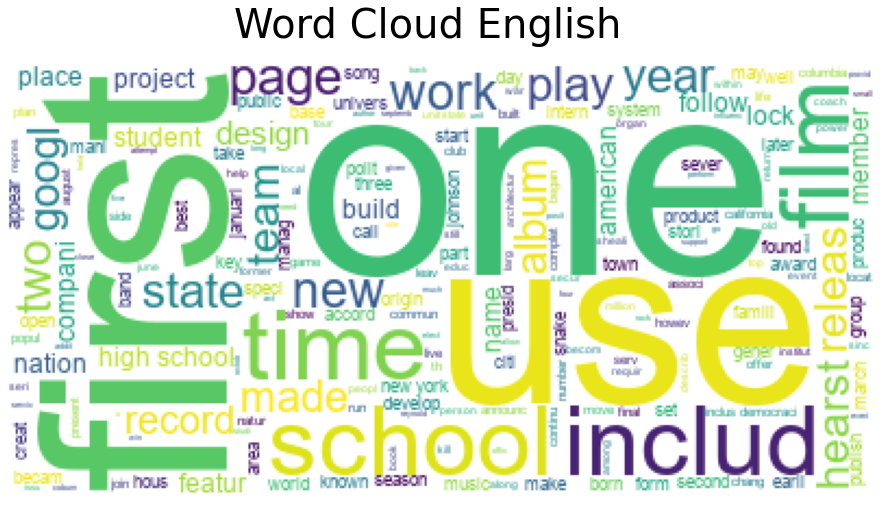

In [32]:
word_cloud('English')

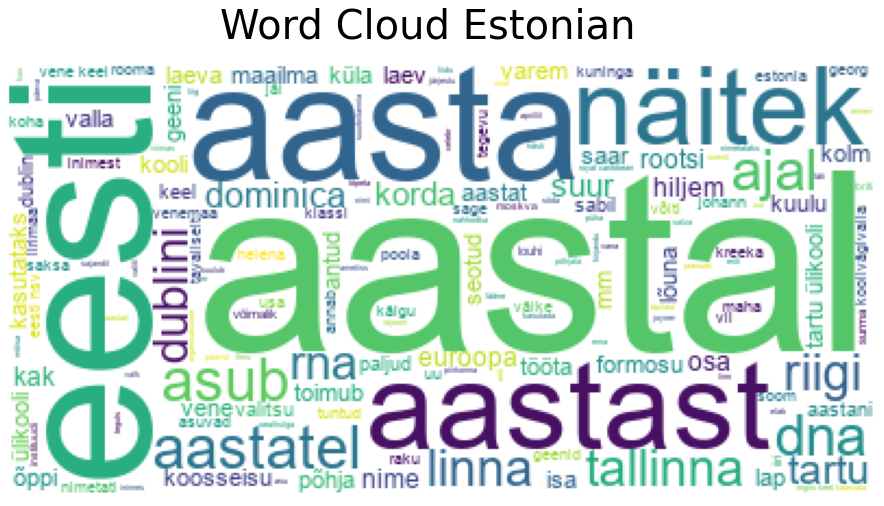

In [33]:
word_cloud('Estonian')

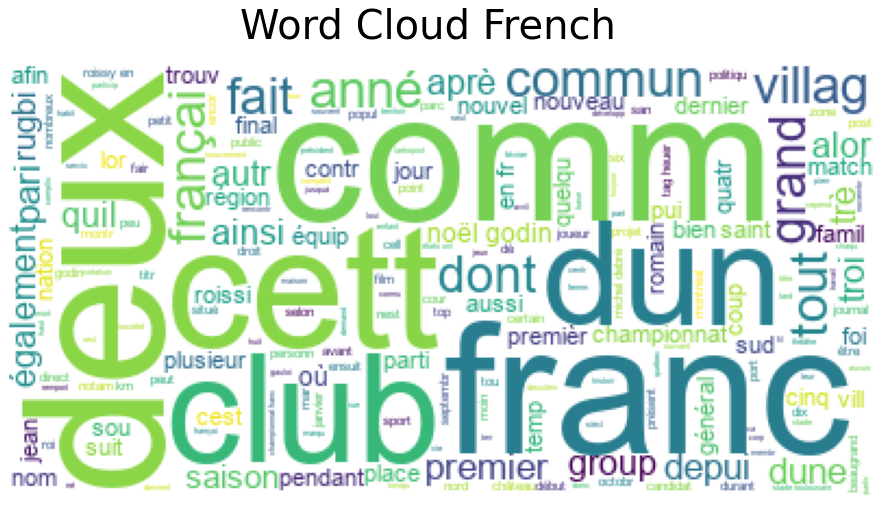

In [34]:
word_cloud('French')

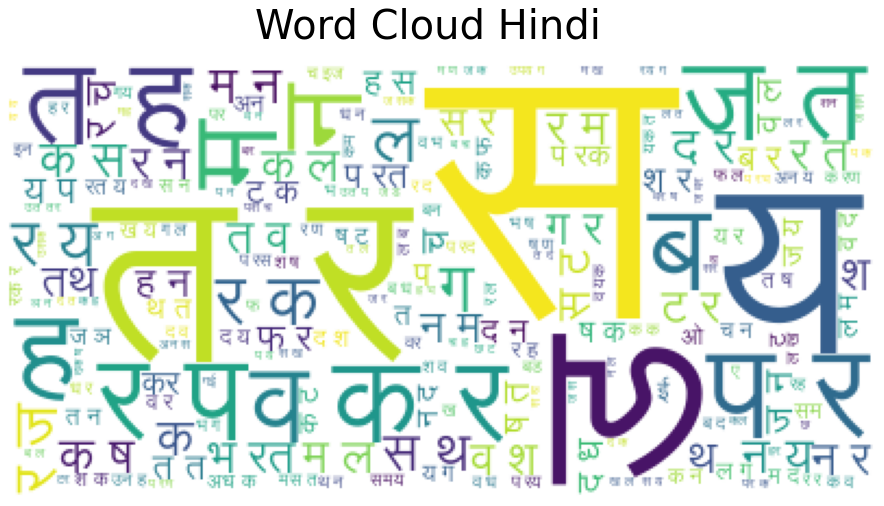

In [35]:
word_cloud('Hindi', r'C:\Users\dariu\AppData\Local\Microsoft\Windows\Fonts\Lohit-Devanagari.ttf')

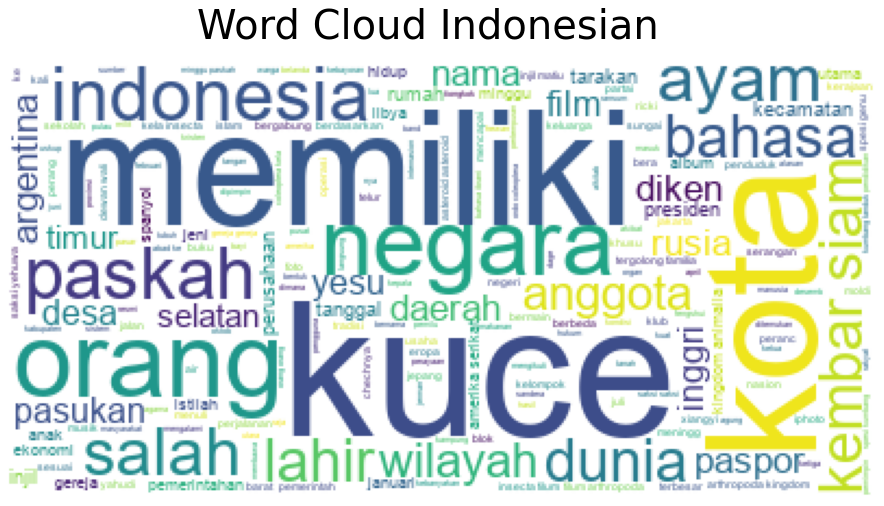

In [36]:
word_cloud('Indonesian')

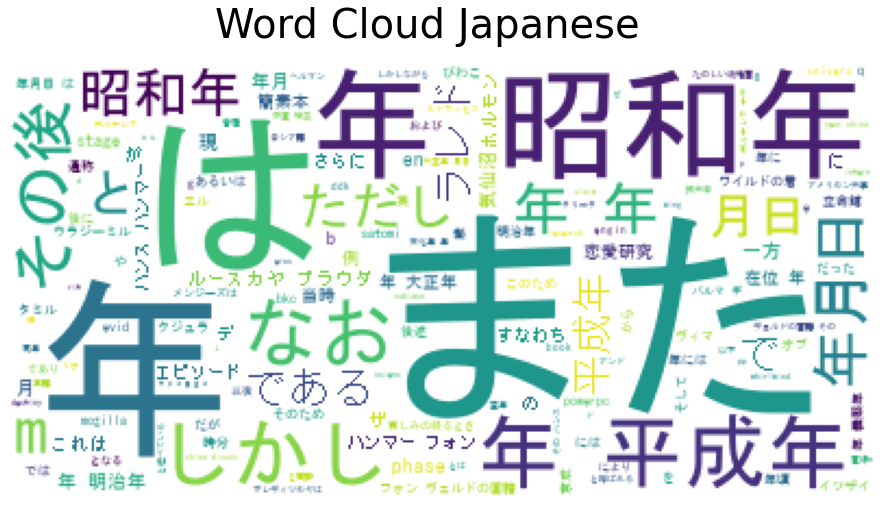

In [37]:
word_cloud('Japanese', r'C:\Windows\Fonts\msgothic.ttc')

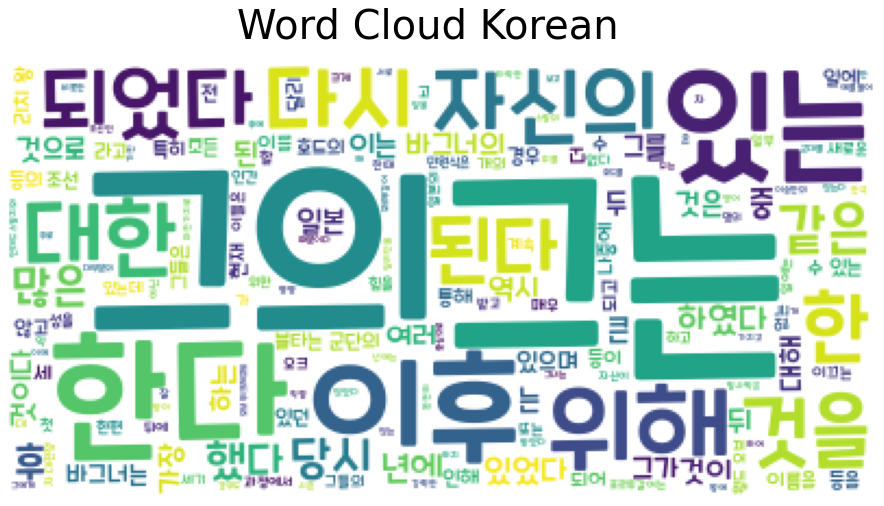

In [38]:
word_cloud('Korean', r'C:\Users\dariu\AppData\Local\Microsoft\Windows\Fonts\CookieRun Regular.ttf')

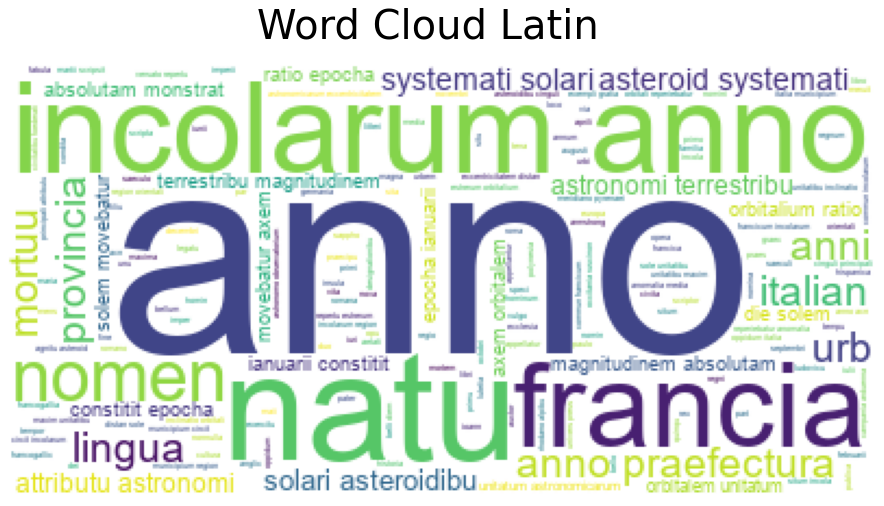

In [39]:
word_cloud('Latin')

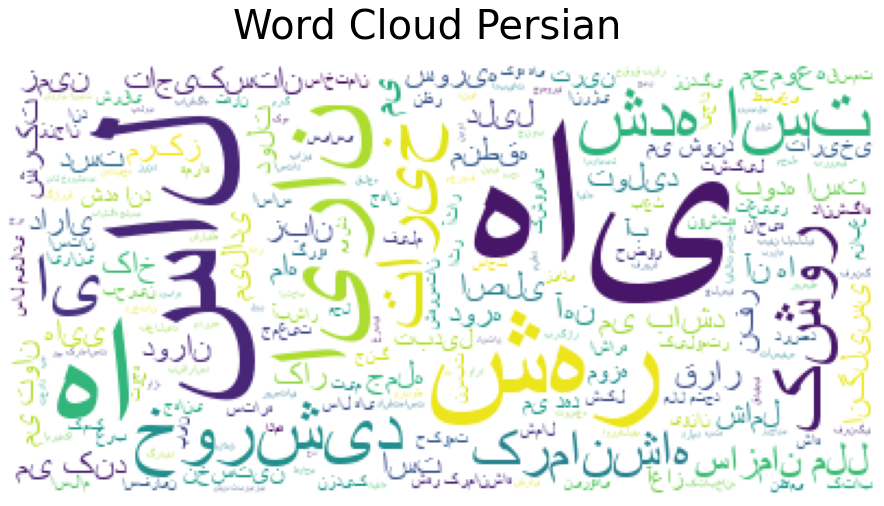

In [40]:
word_cloud('Persian')

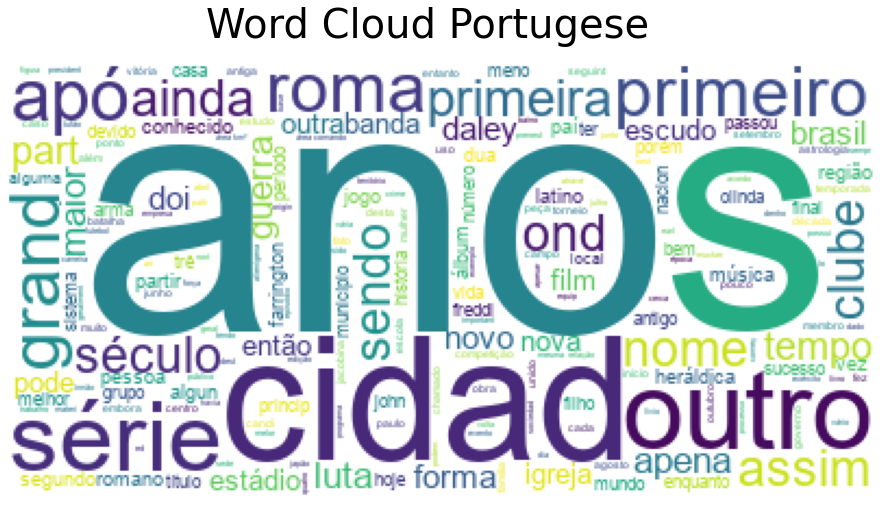

In [41]:
word_cloud('Portugese')

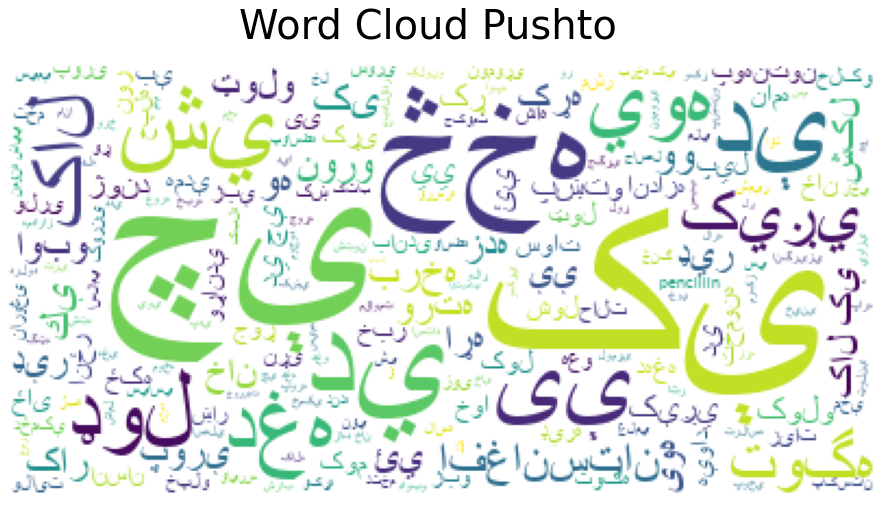

In [42]:
word_cloud('Pushto')

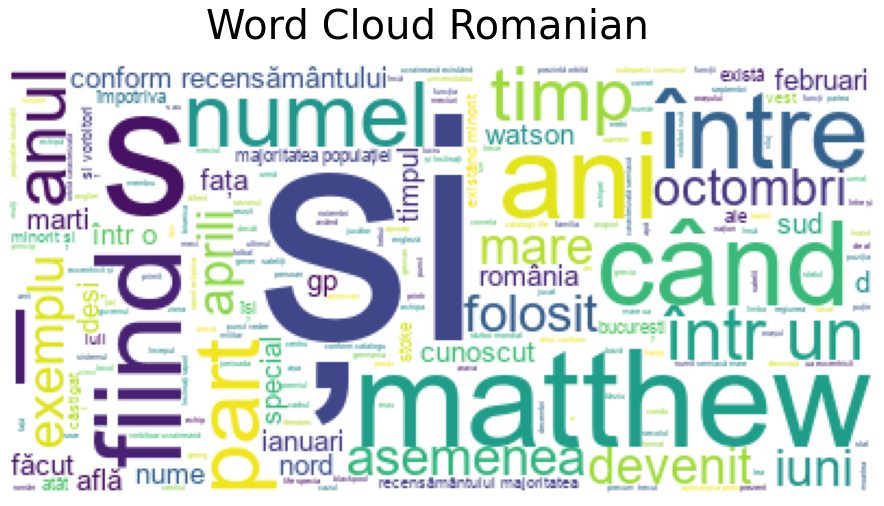

In [43]:
word_cloud('Romanian')

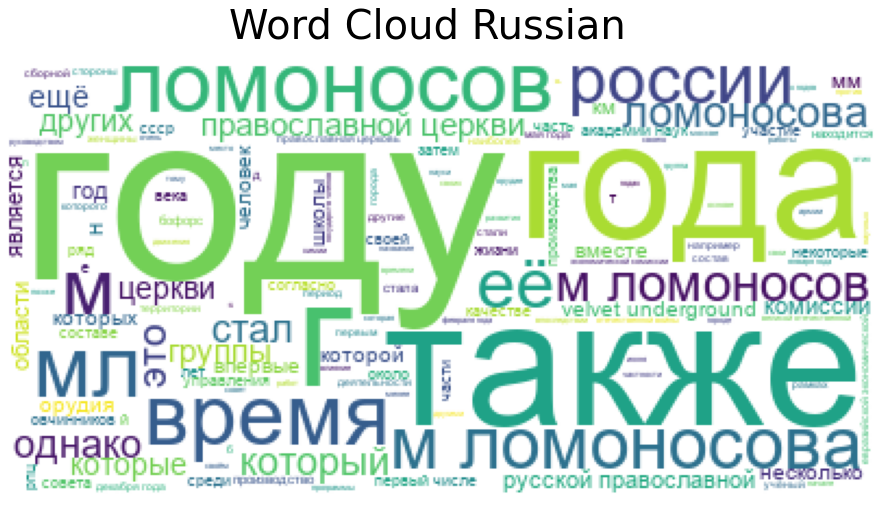

In [44]:
word_cloud('Russian')

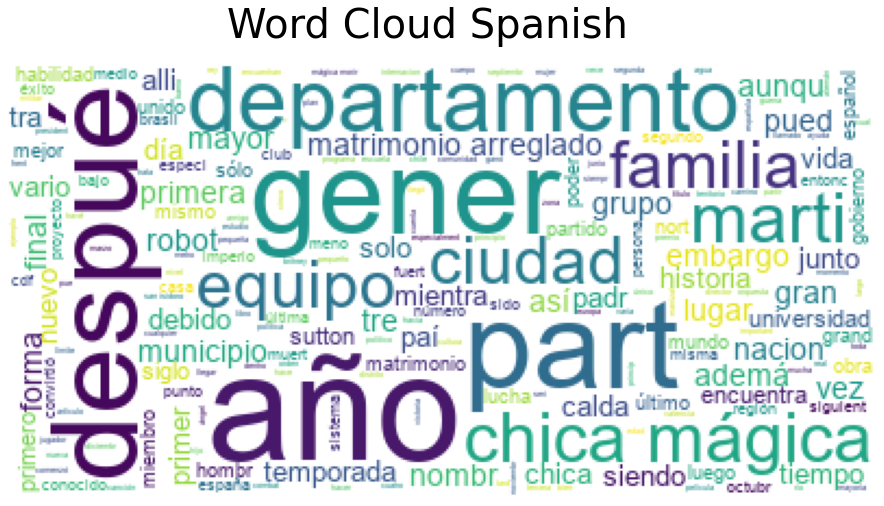

In [45]:
word_cloud('Spanish')

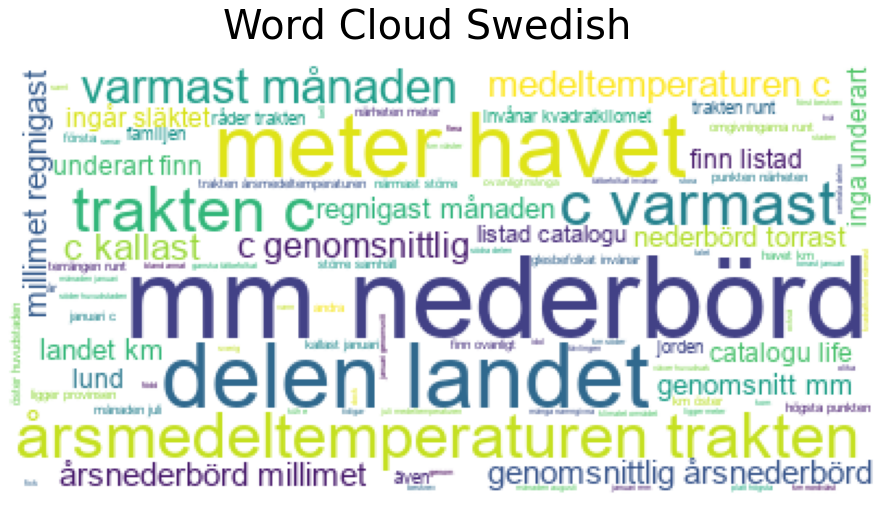

In [46]:
word_cloud('Swedish')

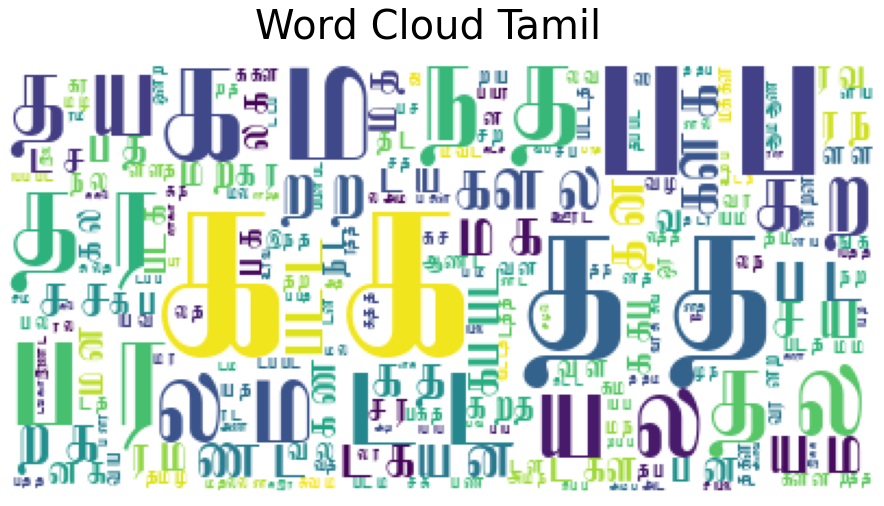

In [47]:
word_cloud('Tamil', r'C:\Users\dariu\AppData\Local\Microsoft\Windows\Fonts\SUNDARAM-0806.ttf')

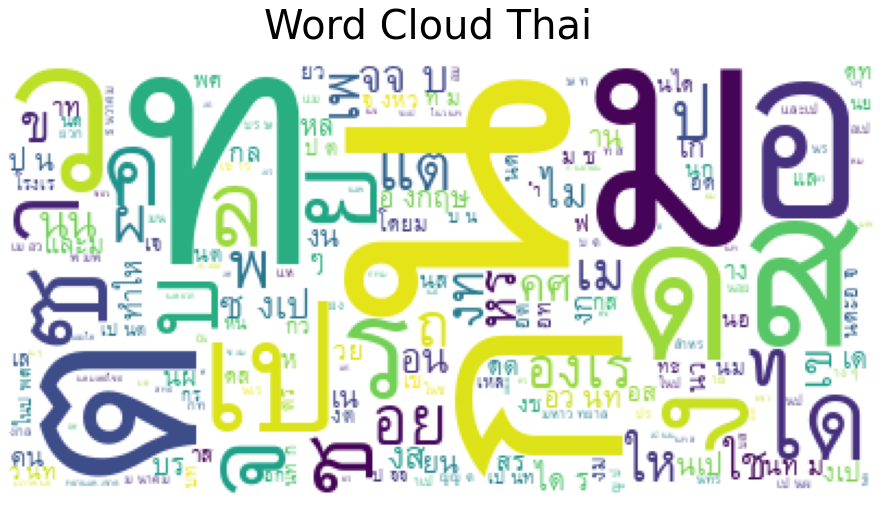

In [48]:
word_cloud('Thai', r'C:\Users\dariu\AppData\Local\Microsoft\Windows\Fonts\Garuda.ttf')

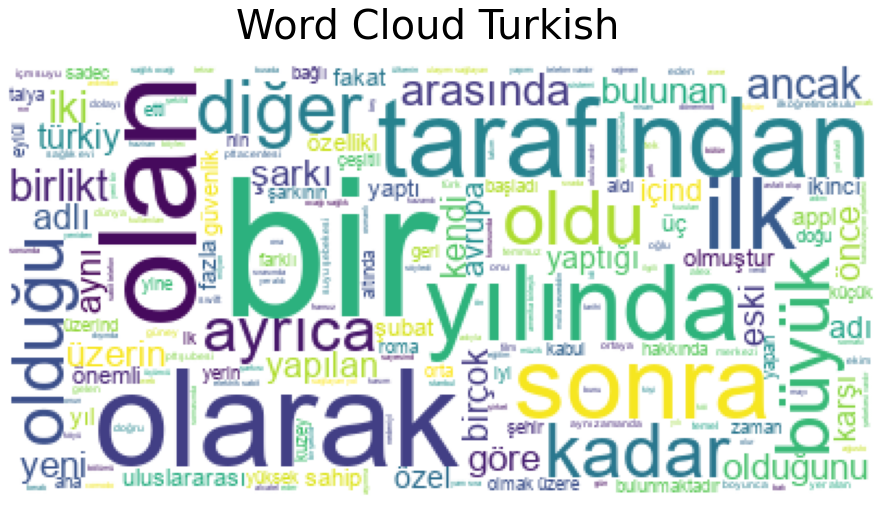

In [49]:
word_cloud('Turkish')

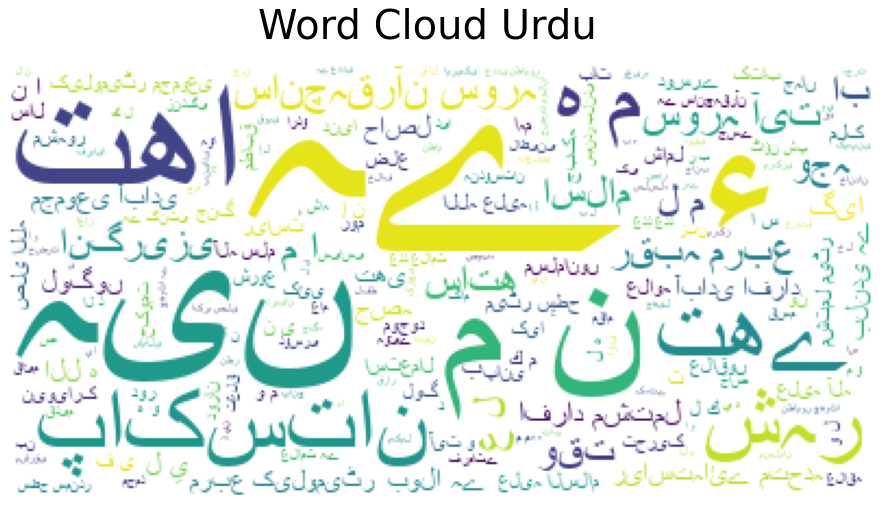

In [50]:
word_cloud('Urdu')

## Splitting into inputs and targets

We split the dataset into X (independent) variable or inputs and y (dependent) variable or targets.

We use Count Vectorizer to transform the input text into a sparse matrix on the basis of the frequency(count) of each word that occurs in the entire text. 

CountVectorizer (also known as Bag of Words) creates a matrix in which each unique word is represented by a column of the matrix, and each text sample from the document is a row in the matrix. The value of each cell is nothing but the count of the word in that particular text sample. 



In [33]:
# defining input variable
# vectorizing input varible 'clean_text' into a matrix 

x = data['clean_text']

cv = CountVectorizer() # ngram_range=(1,2)
x = cv.fit_transform(x)

# changing the datatype of the number into uint8 to consume less memory
x = x.astype('uint8') # uint8 and float32

We convert the datatype from int64 to uint8 which consumes 8 times less bytes in comparison.

A UINT8 is an 8-bit unsigned integer (range: 0 through 255 decimal). 

In [34]:
# defining target variable

y = data['language_encoded']

We split the dataset into training and testing dataset, using 20% of the dataset for testing and rest for training.

In [35]:
# splitting data into training and testing datasets

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2)

## Creating a Naive Bayes model

We create a baseline model to compare our Multilayer Perceptron Neural Network against.

MultinomialNB is suitable for classification with discrete features and hence works well with our given dataset.

In [36]:
# fitting the Multinomial Naive Bayes model

NB_model = MultinomialNB()
NB_model.fit(x_train, y_train)

MultinomialNB()

In [37]:
# predicting using the naive bayes model

y_pred = NB_model.predict(x_test)

In [38]:
# accuracy of the naive bayes model

accuracy_score(y_test, y_pred)

0.9574565416285453

<ipython-input-39-2c6d0fa9351d>:6: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  plt.title('Confusion Matrix - NB_model', Fontsize=20)


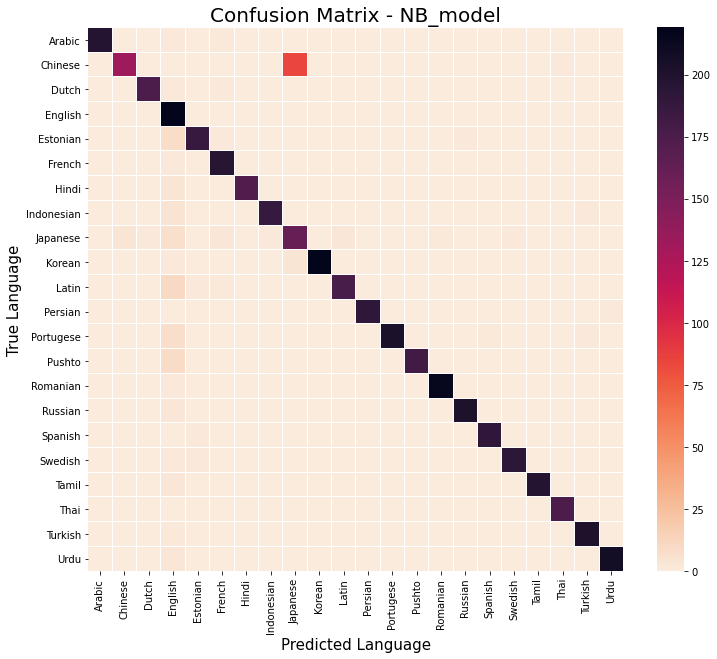

In [39]:
# creating confusion matrix heatmap 

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(12,10))
plt.title('Confusion Matrix - NB_model', Fontsize=20)
sns.heatmap(cm, xticklabels=lang_list, yticklabels=lang_list, cmap='rocket_r', linecolor='white', linewidth=.005)
plt.xlabel('Predicted Language', fontsize=15)
plt.ylabel('True Language', fontsize=15)
plt.show()

We obtain an accuracy of 95.61%. 

Looking at the confusion matrix we see that the model predicted Chinese as Japanese an unsual number of times, this could be due to the similarity between the Hanzi Script (Chinese) and the Kanji Script (Japanese).

In [40]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       201
           1       0.97      0.61      0.75       218
           2       0.99      0.99      0.99       177
           3       0.77      1.00      0.87       219
           4       0.98      0.95      0.97       197
           5       0.96      0.99      0.98       197
           6       1.00      0.98      0.99       177
           7       0.99      0.97      0.98       194
           8       0.65      0.88      0.75       182
           9       1.00      0.98      0.99       224
          10       0.98      0.93      0.95       191
          11       1.00      0.99      1.00       193
          12       1.00      0.95      0.98       213
          13       1.00      0.95      0.98       190
          14       0.99      1.00      0.99       216
          15       1.00      0.99      0.99       205
          16       0.99      0.99      0.99       192
          17       0.99    

## Creating a Multilayer Perceptron model

Tensorflow does not take sparse matrices as input and hence we have to convert our sparse matrix into an array. This requires alot of memory and hence uit8 data type helps.

In [41]:
# converting csr matrix into np.ndarray supported by tensorflow

x_train = x_train.toarray()
x_test = x_test.toarray()

In [42]:
# shapes of the various datasets

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(17487, 261254) (4372, 261254) (17487,) (4372,)


It is convention to define hyperparameters separately with capital letters.

In [43]:
# input size hyperparameter

INPUT_SIZE = x_train.shape[1]
INPUT_SIZE

261254

In [44]:
# outputsize hyperparatmeter

OUTPUT_SIZE = len(data['language_encoded'].unique())
OUTPUT_SIZE

22

EPOCHS indicates the number of passes of the entire training dataset the machine learning algorithm has completed.

We divide the dataset into batches of BATCH_SIZE for ease of computation.

In [45]:
# epochs and batch_size hyperparameters

EPOCHS = 10
BATCH_SIZE = 128

We create a Sequential model with activation function as Rectified Linear Unit(ReLU) and intializer as HE Normal as it works well with ReLU.

Our Neural Network is 5 layers deep and 261254 layers wide.

It contains 3 hidden layers:
- Hidden Layer 1 : 100 nodes 
- Hidden Layer 2 : 80 nodes
- Hidden Layer 3 : 50 nodes

The output layer uses the Soft Max activation function which returns an array of lenght 22 contianing probablity of an element's index being the output.

In [144]:
# creating the MLP model

model = Sequential([
    Dense(100, activation='relu', kernel_initializer='he_normal', input_shape=(INPUT_SIZE,)),
    Dense(80, activation='relu', kernel_initializer='he_normal'),
    Dense(50, activation='relu', kernel_initializer='he_normal'),
    Dense(OUTPUT_SIZE, activation='softmax')
])

We use the Adaptive Moment Estimation (Adam) algorithm for optimization as it is good with sparse data. We use Sparse Categorical Crossentropy as the loss/objective function as it performs well for muliclassification problems.

In [145]:
# compiling the MLP model

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

We split 30% of the training data into validation data to check if the model is overfitting.

In [146]:
# fitting the MLP model

hist = model.fit(x_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_split=0.3, verbose=2)

Epoch 1/10
96/96 - 20s - loss: 1.3444 - accuracy: 0.7517 - val_loss: 0.2489 - val_accuracy: 0.9586
Epoch 2/10
96/96 - 18s - loss: 0.0337 - accuracy: 0.9975 - val_loss: 0.1732 - val_accuracy: 0.9623
Epoch 3/10
96/96 - 18s - loss: 0.0026 - accuracy: 0.9998 - val_loss: 0.1685 - val_accuracy: 0.9621
Epoch 4/10
96/96 - 18s - loss: 0.0017 - accuracy: 0.9998 - val_loss: 0.1689 - val_accuracy: 0.9628
Epoch 5/10
96/96 - 18s - loss: 0.0014 - accuracy: 0.9998 - val_loss: 0.1700 - val_accuracy: 0.9617
Epoch 6/10
96/96 - 18s - loss: 0.0011 - accuracy: 0.9998 - val_loss: 0.1714 - val_accuracy: 0.9613
Epoch 7/10
96/96 - 18s - loss: 9.8561e-04 - accuracy: 0.9998 - val_loss: 0.1734 - val_accuracy: 0.9626
Epoch 8/10
96/96 - 17s - loss: 8.9579e-04 - accuracy: 0.9998 - val_loss: 0.1833 - val_accuracy: 0.9617
Epoch 9/10
96/96 - 17s - loss: 7.9612e-04 - accuracy: 0.9998 - val_loss: 0.1900 - val_accuracy: 0.9596
Epoch 10/10
96/96 - 17s - loss: 7.1880e-04 - accuracy: 0.9998 - val_loss: 0.1881 - val_accuracy: 

In [147]:
# summary of the MLP model

model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 100)               26125500  
_________________________________________________________________
dense_37 (Dense)             (None, 80)                8080      
_________________________________________________________________
dense_38 (Dense)             (None, 50)                4050      
_________________________________________________________________
dense_39 (Dense)             (None, 22)                1122      
Total params: 26,138,752
Trainable params: 26,138,752
Non-trainable params: 0
_________________________________________________________________


Our model is a 5 layer Neural Network with the following architecture.

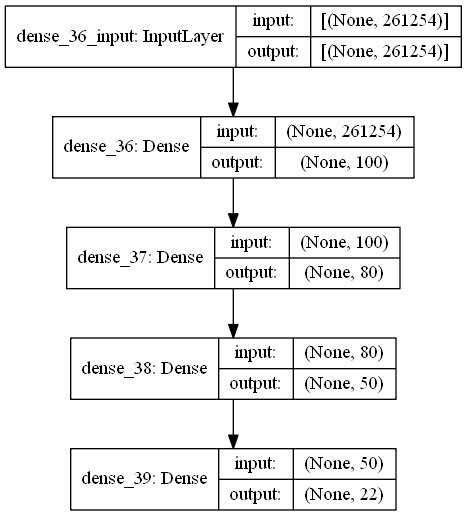

In [148]:
# architetcure of the MLP model

plot_model(model, show_shapes=True)

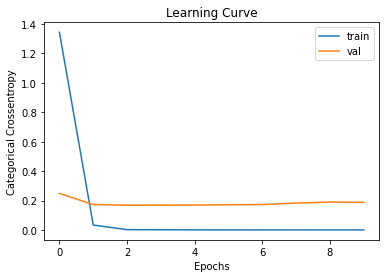

In [149]:
# creating loss vs epochs plot

plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy')
plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='val')
plt.legend()
plt.show()

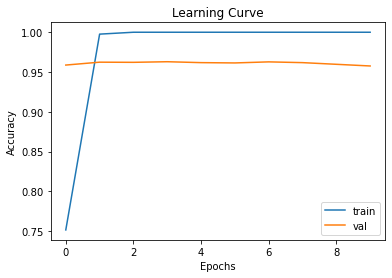

In [150]:
# creating accuracy vs epochs plot

plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(hist.history['accuracy'], label='train')
plt.plot(hist.history['val_accuracy'], label='val')
plt.legend()
plt.show()

We see that are model is overfitting which can lead our accuracy to get lower for new data.

In [151]:
# evaluating the loss and accuracy of the model

loss, accuracy = model.evaluate(x_test, y_test, verbose=2)
print('Accuracy %.3f'%accuracy)

137/137 - 3s - loss: 0.1845 - accuracy: 0.9540
Accuracy 0.954


We obtain an accuracy of 95.4% this is the accuracy that we have to beat after optimization.

## Hyperparameter Tuning

We re-transfrom the dataset and take 10000 samples of the data for our hyperparameter tuning as we would be unable to implement optimization on the entire dataset due to its large size.

In [76]:
# defining input variable
# vectorizing input varible 'clean_text' into a matrix 

x = data['clean_text']
x = x[:10000]

cv = CountVectorizer() # ngram_range=(1,2)
x = cv.fit_transform(x)

# changing the datatype of the number into float32 to consume less memory
x = x.astype('uint8') # uint8 and float32

# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences

# defining target variable

y = data['language_encoded']
y = y[:10000]
# splitting data into training and testing datasets

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2)

In [77]:
# converting csr matrix into np.ndarray supported by tensorflow

x_train = x_train.toarray()
x_test = x_test.toarray()

# shapes of the various datasets

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

# input size hyperparameter

INPUT_SIZE = x_train.shape[1]
INPUT_SIZE

# outputsize hyperparatmeter

OUTPUT_SIZE = len(data['language_encoded'].unique())
OUTPUT_SIZE

(8000, 149196) (2000, 149196) (8000,) (2000,)


22

We define a function that creates a model, this is required by the KerasClassifier. We use the KerasClassifier to link our keras model to sklearn so that we can perform Grid Search and Randomized Search on it's hyperparameters.

In [78]:
def create_model(optimizer='adam', init_mode='he_normal', activation='relu'):
    model = Sequential()
    model.add(Dense(100, activation=activation, kernel_initializer=init_mode, input_shape=(INPUT_SIZE,)))
    model.add(Dense(80, activation=activation, kernel_initializer=init_mode))
    model.add(Dense(50, activation=activation, kernel_initializer=init_mode))
    model.add(Dense(OUTPUT_SIZE, activation='softmax'))
    
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [79]:
model = KerasClassifier(build_fn=create_model, verbose=2)

We define the hyperparameter grid and implement Grid Search while conducting 3 fold cross validation.
The Grid Search Algorithm goes through 16 (4\*4) possible combinations of hyperparameters to find the combination that provides the highest accuracy.

In [80]:
epochs = [2, 4, 6, 8]
batch_size = [32, 64, 128, 256]
param_grid = dict(epochs=epochs, batch_size=batch_size)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=3, cv=3)
grid_result = grid_search.fit(x_train, y_train)

Epoch 1/6
32/32 - 4s - loss: 2.4629 - accuracy: 0.6370
Epoch 2/6
32/32 - 3s - loss: 0.6079 - accuracy: 0.9488
Epoch 3/6
32/32 - 3s - loss: 0.0535 - accuracy: 0.9996
Epoch 4/6
32/32 - 3s - loss: 0.0087 - accuracy: 1.0000
Epoch 5/6
32/32 - 3s - loss: 0.0048 - accuracy: 1.0000
Epoch 6/6
32/32 - 3s - loss: 0.0034 - accuracy: 1.0000


In [81]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.951376 using {'batch_size': 256, 'epochs': 6}


In [82]:
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) %r" % (mean, stdev, param))

0.940750 (0.002427) {'batch_size': 32, 'epochs': 2}
0.928750 (0.001095) {'batch_size': 32, 'epochs': 4}
0.923499 (0.006444) {'batch_size': 32, 'epochs': 6}
0.918749 (0.006929) {'batch_size': 32, 'epochs': 8}
0.938500 (0.005537) {'batch_size': 64, 'epochs': 2}
0.935375 (0.000359) {'batch_size': 64, 'epochs': 4}
0.930374 (0.005533) {'batch_size': 64, 'epochs': 6}
0.918623 (0.009160) {'batch_size': 64, 'epochs': 8}
0.938376 (0.004903) {'batch_size': 128, 'epochs': 2}
0.947751 (0.003579) {'batch_size': 128, 'epochs': 4}
0.946874 (0.004122) {'batch_size': 128, 'epochs': 6}
0.934624 (0.006902) {'batch_size': 128, 'epochs': 8}
0.875748 (0.010311) {'batch_size': 256, 'epochs': 2}
0.950626 (0.004433) {'batch_size': 256, 'epochs': 4}
0.951376 (0.009078) {'batch_size': 256, 'epochs': 6}
0.950124 (0.005922) {'batch_size': 256, 'epochs': 8}


We see that we get the highest accuracy using a batch size of 256 and 6 epochs.

We define the hyperparameter distribution and implement Randomized Search while conducting 3 fold cross validation.
The Randomized Search Algorithm goes through 60 possible combinations of hyperparameters out of a total of 448 (8\*8\*7) combinations to find the combination that provides the highest accuracy.


According to the following law we can say that we have the best 5% of hyperparameters with 95% confidence.

__With 60 iterations 95% of the time, best 5% sets of parameters can be found regardless of grid size.__

In [83]:
model = KerasClassifier(build_fn=create_model, verbose=2, epochs=8, batch_size=256)

In [84]:
init_mode = ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']
activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']
optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

param_dist = dict(init_mode=init_mode, activation=activation, optimizer=optimizer)
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_jobs=3, n_iter=60, cv=3)
random_result = random_search.fit(x_train, y_train)

Epoch 1/8
32/32 - 4s - loss: 2.2809 - accuracy: 0.8430
Epoch 2/8
32/32 - 3s - loss: 0.8234 - accuracy: 0.9930
Epoch 3/8
32/32 - 3s - loss: 0.2737 - accuracy: 0.9990
Epoch 4/8
32/32 - 3s - loss: 0.1185 - accuracy: 1.0000
Epoch 5/8
32/32 - 4s - loss: 0.0688 - accuracy: 1.0000
Epoch 6/8
32/32 - 3s - loss: 0.0464 - accuracy: 1.0000
Epoch 7/8
32/32 - 3s - loss: 0.0339 - accuracy: 1.0000
Epoch 8/8
32/32 - 3s - loss: 0.0261 - accuracy: 1.0000


In [85]:
print("Best: %f using %s" % (random_result.best_score_, random_result.best_params_) )

Best: 0.958875 using {'optimizer': 'Adam', 'init_mode': 'glorot_uniform', 'activation': 'softsign'}


In [86]:
means = random_result.cv_results_['mean_test_score']
stds = random_result.cv_results_['std_test_score']
params = random_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) %r" % (mean, stdev, param))

0.081876 (0.004800) {'optimizer': 'SGD', 'init_mode': 'normal', 'activation': 'tanh'}
0.044000 (0.000770) {'optimizer': 'Adamax', 'init_mode': 'zero', 'activation': 'relu'}
0.043625 (0.001238) {'optimizer': 'Adam', 'init_mode': 'he_normal', 'activation': 'softmax'}
0.041500 (0.002383) {'optimizer': 'SGD', 'init_mode': 'uniform', 'activation': 'softplus'}
0.044625 (0.002305) {'optimizer': 'Adagrad', 'init_mode': 'normal', 'activation': 'softplus'}
0.924376 (0.007065) {'optimizer': 'RMSprop', 'init_mode': 'uniform', 'activation': 'linear'}
0.951001 (0.004972) {'optimizer': 'Adamax', 'init_mode': 'he_uniform', 'activation': 'softsign'}
0.045375 (0.003528) {'optimizer': 'Adagrad', 'init_mode': 'zero', 'activation': 'sigmoid'}
0.042875 (0.004044) {'optimizer': 'Adadelta', 'init_mode': 'glorot_normal', 'activation': 'softplus'}
0.915000 (0.006085) {'optimizer': 'Nadam', 'init_mode': 'uniform', 'activation': 'relu'}
0.046125 (0.000619) {'optimizer': 'Adadelta', 'init_mode': 'uniform', 'activa

We see that we get the highest accuracy while using Adam as optimizer, Glorot Uniform as the kernel_intializer and Softsign as the activation function.

Hence we conclude that the optimal hyperparameters for our model are:
- BATCH_SIZE = 256
- EPOCHS = 6
- optimizer = Adam
- kenel_initialzier = glorot_uniform
- activation = softsign

## Creating the optimized model

We re-transform the data to obtain the entire dataset.

In [57]:
# defining input variable
# vectorizing input varible 'clean_text' into a matrix 

x = data['clean_text']

cv = CountVectorizer() # ngram_range=(1,2)
x = cv.fit_transform(x)

# changing the datatype of the number into uint8 to consume less memory
x = x.astype('uint8') # uint8 and float32

In [58]:
# defining target variable

y = data['language_encoded']

In [59]:
# splitting data into training and testing datasets

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2)

In [60]:
# converting csr matrix into np.ndarray supported by tensorflow

x_train = x_train.toarray()
x_test = x_test.toarray()

In [61]:
# shapes of the various datasets

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(17487, 261254) (4372, 261254) (17487,) (4372,)


We create an optimized model using the hyperparameters found in Grid Search and Randomized Search.

In [62]:
# input size hyperparameter

INPUT_SIZE = x_train.shape[1]
INPUT_SIZE

# outputsize hyperparatmeter

OUTPUT_SIZE = len(data['language_encoded'].unique())
OUTPUT_SIZE

22

In [63]:
BATCH_SIZE = 256
EPOCHS = 8

We configure early stopping to avoid overfitting.

In [64]:
# configuring early stopping

es = EarlyStopping(monitor='accuracy', patience=1)

We create a Sequential model with activation function as softsign and intializer as glorot_uniform. 
Our Neural Network is 5 layers deep and 261254 layers wide.

It contains 3 hidden layers:
- Hidden Layer 1 : 100 nodes 
- Hidden Layer 2 : 80 nodes
- Hidden Layer 3 : 50 nodes

The output layer uses the Soft Max activation function which returns an array of lenght 22 contianing probablity of an element's index being the output.

In [65]:
# creating the MLP model

model = Sequential([
    Dense(100, activation='softsign', kernel_initializer='glorot_uniform', input_shape=(INPUT_SIZE,)),
    Dense(80, activation='softsign', kernel_initializer='glorot_uniform'),
    Dense(50, activation='softsign', kernel_initializer='glorot_uniform'),
    Dense(OUTPUT_SIZE, activation='softmax')
])

We use the Adaptive Moment Estimation (Adam) algorithm for optimization as it is good with sparse data. We use Sparse Categorical Crossentropy as the loss/objective function as it performs well for muliclassification problems.

In [66]:
# compiling the MLP model

model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

We split 30% of the training data into validation data to check if the model is overfitting.

In [67]:
# fitting the model with earlystopping callback to avoid overfitting 

hist = model.fit(x_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_split=0.3, callbacks=[es], verbose=2)

Epoch 1/8
48/48 - 23s - loss: 1.8727 - accuracy: 0.8836 - val_loss: 0.9309 - val_accuracy: 0.9522
Epoch 2/8
48/48 - 13s - loss: 0.4052 - accuracy: 0.9956 - val_loss: 0.3557 - val_accuracy: 0.9665
Epoch 3/8
48/48 - 13s - loss: 0.1117 - accuracy: 0.9995 - val_loss: 0.2301 - val_accuracy: 0.9680
Epoch 4/8
48/48 - 13s - loss: 0.0534 - accuracy: 0.9998 - val_loss: 0.1871 - val_accuracy: 0.9684
Epoch 5/8
48/48 - 13s - loss: 0.0332 - accuracy: 0.9998 - val_loss: 0.1660 - val_accuracy: 0.9684
Epoch 6/8
48/48 - 13s - loss: 0.0233 - accuracy: 0.9998 - val_loss: 0.1542 - val_accuracy: 0.9676


In [68]:
# summary of the MLP model

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 100)               26125500  
_________________________________________________________________
dense_5 (Dense)              (None, 80)                8080      
_________________________________________________________________
dense_6 (Dense)              (None, 50)                4050      
_________________________________________________________________
dense_7 (Dense)              (None, 22)                1122      
Total params: 26,138,752
Trainable params: 26,138,752
Non-trainable params: 0
_________________________________________________________________


Our model is a 5 layer Neural Network with the following architecture.

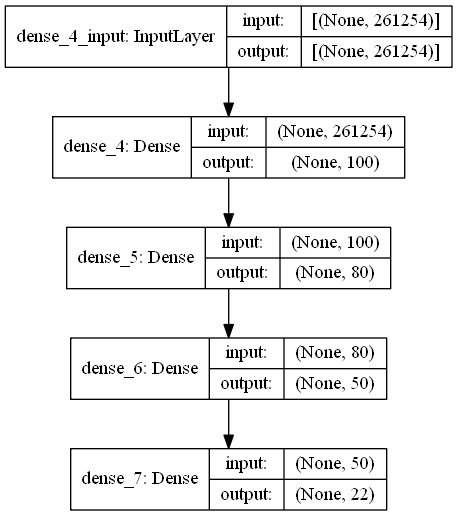

In [69]:
# architetcure of the MLP model

plot_model(model, show_shapes=True)

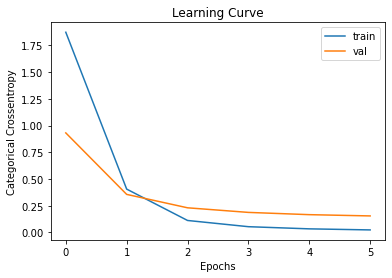

In [70]:
# creating loss vs epochs plot

plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy')
plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='val')
plt.legend()
plt.show()

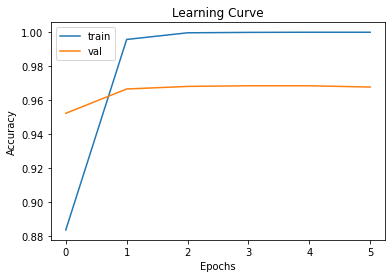

In [71]:
# creating accuracy vs epochs plot

plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(hist.history['accuracy'], label='train')
plt.plot(hist.history['val_accuracy'], label='val')
plt.legend()
plt.show()

In [72]:
# evaluating the loss and accuracy of the model

loss, accuracy = model.evaluate(x_test, y_test, verbose=2)
print('Accuracy %.3f'%accuracy)

137/137 - 3s - loss: 0.1590 - accuracy: 0.9680
Accuracy 0.968


Our model MLP obtains an accuracy of 96.8% which beats are MultinomialNB model (96.8%).

<ipython-input-73-2471fde572b2>:12: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  plt.title('Confusion Matrix - MLP Model', Fontsize=20)


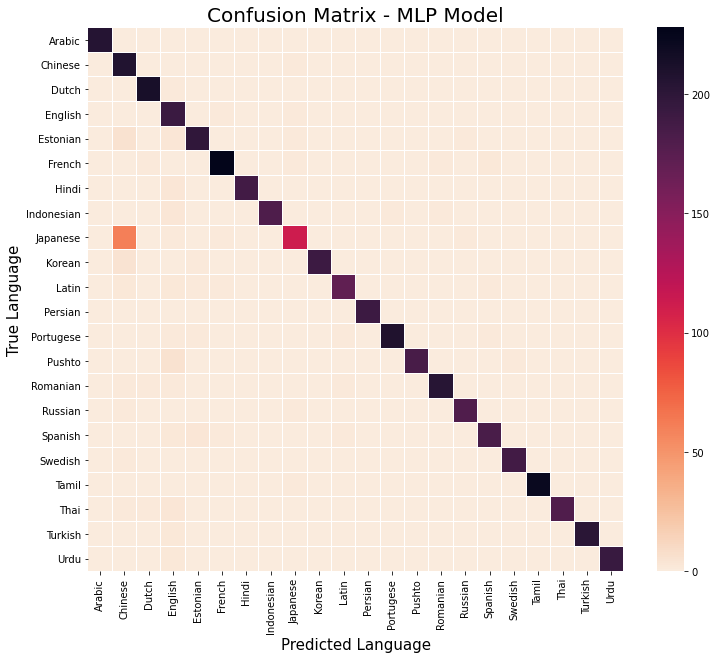

In [73]:
y_pred_prob = model.predict(x_test) # returns an array containing probability for each category being output
y_pred = []
for i in y_pred_prob:
    out = np.argmax(i) # taking the highest probability category as output
    y_pred.append(out)
y_pred = np.array(y_pred)

cm = confusion_matrix(y_test, y_pred) # confusion matrix

# heat map of confusion matrix
plt.figure(figsize=(12,10))
plt.title('Confusion Matrix - MLP Model', Fontsize=20)
sns.heatmap(cm, xticklabels=lang_list, yticklabels=lang_list, cmap='rocket_r', linecolor='white', linewidth=.005)
plt.xlabel('Predicted Language', fontsize=15)
plt.ylabel('True Language', fontsize=15)
plt.show()

Looking at the confusion matrix we see that the model predicted Japanese as Chinese an unsual number of times, this could be due to the similarity between the Hanzi Script (Chinese) and the Kanji Script (Japanese).

In [74]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       205
           1       0.73      1.00      0.84       209
           2       0.99      1.00      0.99       214
           3       0.87      0.99      0.92       195
           4       0.97      0.95      0.96       210
           5       0.98      0.98      0.98       233
           6       1.00      0.98      0.99       191
           7       1.00      0.97      0.99       186
           8       0.95      0.64      0.76       177
           9       1.00      0.97      0.98       198
          10       0.98      0.96      0.97       178
          11       1.00      1.00      1.00       192
          12       1.00      0.98      0.99       213
          13       1.00      0.96      0.98       192
          14       0.99      0.98      0.99       208
          15       0.99      0.99      0.99       182
          16       0.98      0.96      0.97       191
          17       0.99    

## Saving the model

We save the model for deployment in the future.

In [75]:
# saving the model

model.save('language_identifcation_model.h5')

## Predicting using the model

We load the model and deploy it to predict the language of unknown text.

In [76]:
# loading the model

model = load_model('language_identifcation_model.h5')

In [77]:
# using the model for prediction

sent = """आप कितना सोचते हो
अगर आप ठिठुरती रातों को गिनें
अरे क्या आप मिल सकते हैं (अरे, क्या आप मिल सकते हैं?)
क्या तुम मिलोगे (क्या तुम मिलोगे?)
सर्दियों का अंत बताओ
एक कोमल वसंत के दिन तक
मैं चाहता हूं कि तुम तब तक रहो जब तक फूल खिल न जाएं
ज्यों का त्यों"""


sent = cv.transform([sent])
ans = model.predict(sent)
ans = np.argmax(ans)
le.inverse_transform([ans])

array(['Hindi'], dtype=object)